# Time series forecasting of fuel price

# Data Exploration

In [1]:
# import libraries
import pandas as pd
import numpy as np

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.api import qqplot

from matplotlib import pyplot
from pandas.plotting import lag_plot
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(15,5)})

import xgboost as xgb
from xgboost import plot_importance
from sklearn import metrics 

# Set global style settings
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['axes.linewidth'] = 1  
plt.rcParams['axes.edgecolor'] = 'gray' 
plt.rcParams['axes.labelsize'] = 11 # 11
plt.rcParams['xtick.labelsize'] = 10 # 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']  # Ensure Times New Roman is used if available
plt.rcParams['figure.dpi'] = 400  
plt.rcParams['legend.fontsize'] = 10


In [2]:
# import data
data_raw = pd.read_excel('data/fuel_types_all.xlsx')
data_raw.tail()

,Date,Ottawa,Toronto West/Ouest,Toronto East/Est,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average/Moyenne provinciale,Southern Average/Moyenne du sud de l'Ontario,Northern Average/Moyenne du nord de l'Ontario,Fuel Type,Type de carburant
10737,2024-07-02,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile
10738,2024-07-08,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile
10739,2024-07-15,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile
10740,2024-07-22,129.9,77.9,73.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,91.7,90.5,119.1,Auto Propane,Propane automobile
10741,2024-07-29,129.9,77.9,73.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,91.7,90.5,119.1,Auto Propane,Propane automobile


In [3]:
data_raw[data_raw['Ontario Average/Moyenne provinciale'] > .01].min()

Date                                             1990-01-03 00:00:00
Ottawa                                                           0.0
Toronto West/Ouest                                               0.0
Toronto East/Est                                                 0.0
Windsor                                                          0.0
London                                                           0.0
Peterborough                                                     0.0
St. Catharine's                                                  0.0
Sudbury                                                          0.0
Sault Saint Marie                                                0.0
Thunder Bay                                                      0.0
North Bay                                                        0.0
Timmins                                                          0.0
Kenora                                                           0.0
Parry Sound                       

In [4]:
# Obtain right format for date column
data_raw.set_index('Date', inplace=True)
data_raw.index = pd.to_datetime(data_raw.index)
#print(data_raw.info())

In [5]:
data_raw['Fuel Type'].unique()

array(['Regular Unleaded Gasoline', 'Diesel', 'Compressed Natural Gas',
       'Mid-Grade Gasoline', 'Premium Gasoline', 'Auto Propane'],
      dtype=object)

In [6]:
data_raw.describe()

,Ottawa,Toronto West/Ouest,Toronto East/Est,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average/Moyenne provinciale,Southern Average/Moyenne du sud de l'Ontario,Northern Average/Moyenne du nord de l'Ontario
count,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000,10742.000000
mean,82.634295,80.548352,81.563526,81.474921,83.220164,12.654915,12.926382,71.933718,79.646267,69.892618,60.689090,63.152225,15.870052,13.082145,85.241510,74.433122,80.669019
std,41.802555,42.338051,41.019056,39.029077,39.624125,42.749957,43.648977,52.982102,49.741748,58.870858,59.102686,61.174445,47.778526,44.187874,37.403298,48.418853,49.272920
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,55.800000,52.500000,53.900000,54.900000,55.800000,0.000000,0.000000,39.100000,52.600000,0.000000,0.000000,0.000000,0.000000,0.000000,57.200000,49.600000,54.100000
50%,74.900000,69.900000,70.800000,69.900000,76.600000,0.000000,0.000000,67.500000,79.000000,74.150000,58.800000,62.400000,0.000000,0.000000,73.000000,67.400000,80.400000
75%,112.200000,110.900000,111.000000,107.000000,109.400000,0.000000,0.000000,112.800000,115.200000,119.000000,112.400000,117.800000,0.000000,0.000000,110.800000,110.200000,116.900000
max,240.800000,240.200000,241.800000,245.600000,239.700000,233.600000,239.100000,248.200000,244.200000,242.200000,244.100000,244.400000,243.000000,239.800000,239.600000,240.300000,241.100000


In [7]:
# Average fuel price based on fuel type
print('Avg price', data_raw['Ontario Average/Moyenne provinciale'].mean())
print('Min price', data_raw['Ontario Average/Moyenne provinciale'].min())
print('Max price', data_raw['Ontario Average/Moyenne provinciale'].max())
a = data_raw[data_raw['Fuel Type']=='Regular Unleaded Gasoline']['Ontario Average/Moyenne provinciale'].mean() 
b= data_raw[data_raw['Fuel Type']=='Diesel']['Ontario Average/Moyenne provinciale'].mean() 
c=data_raw[data_raw['Fuel Type']=='Compressed Natural Gas']['Ontario Average/Moyenne provinciale'].mean() 
d=data_raw[data_raw['Fuel Type']=='Mid-Grade Gasoline']['Ontario Average/Moyenne provinciale'].mean() 
e=data_raw[data_raw['Fuel Type']=='Premium Gasoline']['Ontario Average/Moyenne provinciale'].mean() 
f=data_raw[data_raw['Fuel Type']=='Auto Propane']['Ontario Average/Moyenne provinciale'].mean() 
print(a,b,c,d,e,f)
#df[df["col1"]==entry]["col2"].mean()

Avg price 85.24150996090114
Min price 0.0
Max price 239.6
92.39091412742383 92.12382271468144 64.54245777518928 100.6784487534626 105.70509695290859 54.99916897506925


In [8]:
# Extract required data only
# Response variable, y = Fuel price in Ontario (all other columns are redundant for our time series forecasting
processed_data = pd.DataFrame()
# +++ Change target value
processed_data['fuel_price'] = data_raw['Ontario Average/Moyenne provinciale'].copy() # Ontario Average/Moyenne provinciale
# withtout copy, all operations of dataframe will be in-place (which is not a good practise from data science perspective)
processed_data['fuel_type'] = data_raw['Fuel Type'].copy() # withtout copy, all operations of dataframe will be in-place (which is not a good practise from data science perspective)


processed_data = processed_data[processed_data['fuel_type'] == 'Regular Unleaded Gasoline'] 
# 'Regular Unleaded Gasoline', 'Diesel', 'Compressed Natural Gas', 'Mid-Grade Gasoline', 'Premium Gasoline', 'Auto Propane'
processed_data = processed_data[processed_data.index > '01-01-2014']
processed_data = processed_data.drop('fuel_type', axis=1)
# df.loc[(df['col1'] == value) & (df['col2'] < value)]
#input_data[df.fuel_price > 10]
display(processed_data)

,fuel_price
Date,
2014-01-06,125.3
2014-01-13,126.4
2014-01-20,125.7
2014-01-27,126.5
2014-02-03,127.3
...,...
2024-07-02,165.2
2024-07-08,166.9
2024-07-15,166.0


## Fuel Price Fig4

In [9]:
## Create subset of data for latest 5 years
data_2014_2023 = data_raw[data_raw.index > '01-01-2014']
data_2014_2023.to_excel('data/data_2014_2023.xlsx')

In [10]:
display(data_2014_2023)

,Ottawa,Toronto West/Ouest,Toronto East/Est,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average/Moyenne provinciale,Southern Average/Moyenne du sud de l'Ontario,Northern Average/Moyenne du nord de l'Ontario,Fuel Type,Type de carburant
Date,,,,,,,,,,,,,,,,,,,
2014-01-06,123.5,124.6,124.8,127.5,122.2,0.0,0.0,134.6,133.9,130.7,128.1,138.7,0.0,0.0,125.3,124.4,132.8,Regular Unleaded Gasoline,Essence sans plomb
2014-01-13,124.8,126.7,126.5,122.8,123.1,0.0,0.0,132.6,133.9,130.7,126.6,138.8,0.0,0.0,126.4,125.7,132.0,Regular Unleaded Gasoline,Essence sans plomb
2014-01-20,124.2,125.9,125.6,120.7,123.4,0.0,0.0,131.7,133.9,130.7,126.0,138.7,0.0,0.0,125.7,124.9,131.6,Regular Unleaded Gasoline,Essence sans plomb
2014-01-27,125.1,126.9,126.7,120.3,124.2,0.0,0.0,132.6,133.9,130.7,126.6,138.7,0.0,0.0,126.5,125.8,132.0,Regular Unleaded Gasoline,Essence sans plomb
2014-02-03,126.2,127.3,127.3,124.1,125.2,0.0,0.0,132.6,133.9,130.7,125.3,138.7,0.0,0.0,127.3,126.7,131.8,Regular Unleaded Gasoline,Essence sans plomb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-02,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile
2024-07-08,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile
2024-07-15,129.9,77.9,87.9,87.9,105.1,0.0,0.0,0.0,0.0,119.0,0.0,0.0,120.0,0.0,96.0,95.0,119.1,Auto Propane,Propane automobile


### Fig4a by location


In [11]:
df_location = data_2014_2023.groupby(pd.Grouper(freq="Y")) 
data_2014_2023.columns
#df_location.head()
data0 = data_2014_2023.drop(['Fuel Type', 'Type de carburant'], axis=1)
data2 = data0.groupby([(data_2014_2023.index.year)]).mean()
data2.columns

df_location = data2[['Ottawa', 'Toronto West/Ouest', 'Toronto East/Est', 'Windsor',
       'London', 'Peterborough', "St. Catharine's", 'Sudbury',
       'Sault Saint Marie', 'Thunder Bay', 'North Bay', 'Timmins', 'Kenora',
       'Parry Sound']]
df_location

,Ottawa,Toronto West/Ouest,Toronto East/Est,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound
Date,,,,,,,,,,,,,,
2014,105.758974,102.820192,114.931090,98.936538,102.687179,0.000000,0.000000,92.124679,112.833333,109.759295,89.999679,94.667308,0.000000,0.000000
2015,88.698718,89.098397,96.906090,78.520513,83.682372,0.000000,0.000000,77.198718,94.103526,93.995192,76.091346,79.367949,0.000000,0.000000
2016,81.069551,88.334936,87.564744,73.574038,77.052244,0.000000,0.000000,71.412821,87.701923,88.411218,69.811538,73.624038,0.000000,0.000000
2017,102.168592,103.178700,104.649819,96.656318,100.941877,0.000000,0.000000,100.052708,108.651264,109.005415,88.811191,93.794224,0.000000,0.000000
2018,121.736226,119.264528,118.635472,114.990566,121.594340,0.000000,0.000000,107.911698,127.638113,131.147925,105.413208,110.586038,0.000000,0.000000
2019,97.924679,93.110577,93.347115,102.678205,107.921154,0.000000,0.000000,86.088782,101.880128,107.595513,85.090064,87.565705,0.000000,0.000000
2020,87.258013,82.585256,81.901923,93.094551,97.779167,51.746154,52.889103,75.743910,92.997115,97.108974,75.557692,76.617949,67.685897,52.973077
2021,109.599038,105.093910,105.921795,117.754808,118.973077,89.932692,91.799679,96.375000,113.583013,116.470192,95.021154,95.246795,112.536218,92.731090
2022,146.933013,140.037500,138.737179,152.387500,153.909936,120.178846,122.727244,127.875962,139.668590,145.436859,128.157692,129.883974,148.525641,124.881090


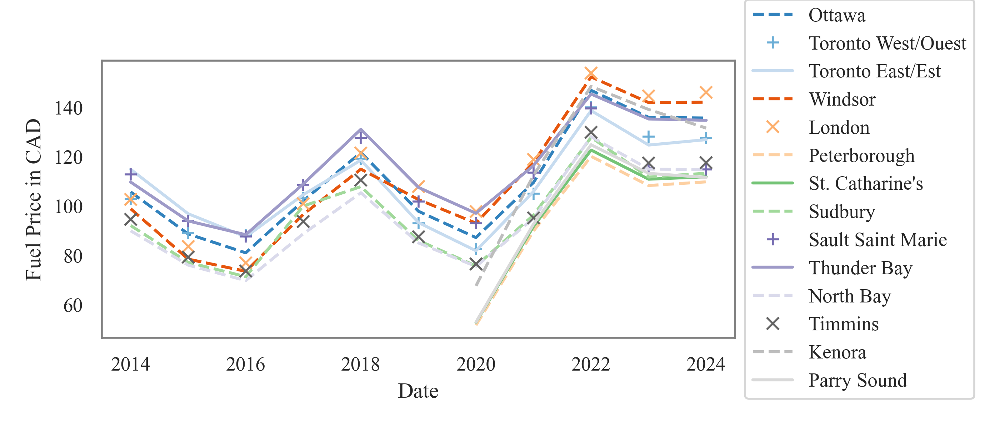

In [12]:
%matplotlib widget

df_location2 = df_location.replace(0, np.nan, inplace=False)
plt.rcParams["figure.figsize"] = [7, 3]
df_location2.plot(colormap='tab20c', style=['--', '+','-','--','x','--','-','--', '+','-','--','x','--','-']) # no colormap  bwr

plt.xlabel('Date')
plt.ylabel('Fuel Price in CAD')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig('figs/location-wise price.png')
plt.show()
# https://matplotlib.org/stable/users/explain/colors/colormaps.html

### Fig4b by Fuel type

Index(['Date', 'Ontario Average/Moyenne provinciale', 'Fuel Type'], dtype='object')

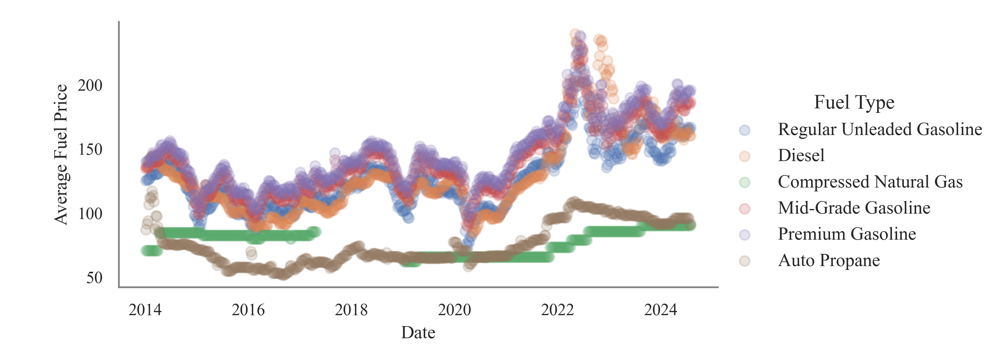

In [13]:
data_priceVsType = data_2014_2023[['Ontario Average/Moyenne provinciale', 'Fuel Type']].reset_index() #.to_csv('data.csv')
legend1 = list(data_priceVsType['Fuel Type'].unique())

fg = sns.FacetGrid(data=data_priceVsType, hue='Fuel Type', height=3, aspect=2)
fg.map(plt.scatter, 'Date', 'Ontario Average/Moyenne provinciale', alpha=0.2).add_legend(fontsize=11)

plt.xlabel('Date')
plt.ylabel('Average Fuel Price')
fg.savefig('figs/fuelType_vs_price.png')
#ax.scatter(data = data_priceVsType, x= 'Date', y='Ontario Average/Moyenne provinciale', 
#           c='Fuel Type')
# average price
# This section should be moved to EDA section, but putting it here to maintain chronology with the technical report 
data_priceVsType['Fuel Type'].unique()
data_priceVsType.columns

## Feature Engineering

### New features

In [14]:
def create_features(df):
    """    Create time series features based on time series index.
    """
    df = df.copy()
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week
    return df

data = create_features(data_raw)

### Train & Test split

Training set 2014-2022 (9 years)
Validation set 2023
Test set 2014 Q1

In [15]:
train_raw = processed_data.loc[processed_data.index < '01-07-2023']  #  and 
validation_raw = processed_data[(processed_data.index >= '01-01-2023') & (processed_data.index <= '31-12-2023')]
test_raw = processed_data[(processed_data.index >= '01-01-2024') & (processed_data.index <= '31-03-2024')]
# df[(df['Date'] > start_date) & (df['Date'] < end_date)]
processed_data.tail(10)

,fuel_price
Date,
2024-05-27,162.8
2024-06-03,160.9
2024-06-10,159.4
2024-06-17,160.3
2024-06-24,164.5
2024-07-02,165.2
2024-07-08,166.9
2024-07-15,166.0
2024-07-22,165.2


In [16]:
train = create_features(train_raw)
validation = create_features(validation_raw)
test = create_features(test_raw)

xs = ['dayofyear', 'dayofweek', 'quarter', 'month', 'year']
X_train = train[xs]
X_validation = validation[xs]
X_test = test[xs]

y_train = train['fuel_price'].values
y_validation = validation['fuel_price'].values
y_test = test['fuel_price'].values 

## Assumptions

### Monthly pattern: Fig5a

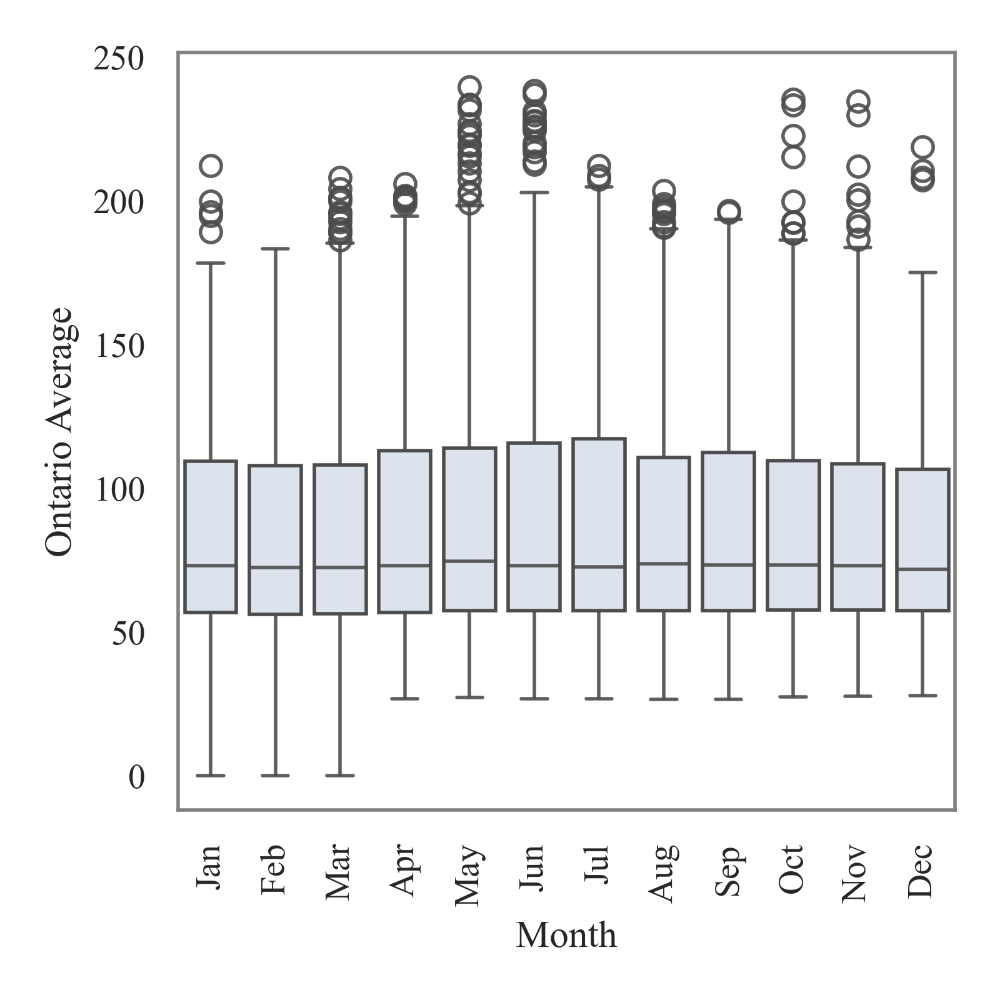

In [17]:
# Create the boxplot
fig, ax = plt.subplots(figsize=(4, 4))
boxplot = sns.boxplot(data=data, x='month', y='Ontario Average/Moyenne provinciale')

# Set custom x-tick labels correctly without using FixedFormatter
ax.set_xticks(range(12))
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=90)

# Set ylabel

plt.xlabel('Month')
plt.ylabel('Ontario Average')
# Adjust the transparency (alpha) of the boxplot elements
for box in ax.artists:
    box.set_alpha(0.2)  # Set transparency for the box

# Adjust transparency for whiskers, caps, and fliers
for line in ax.lines:
    line.set_alpha(0.9)
    
for patch in ax.patches:
    face_color = patch.get_facecolor()
    patch.set_facecolor((face_color[0], face_color[1], face_color[2], 0.2))  # Set RGBA where A=0.2 for transparency

plt.tight_layout()
# Save the figure
plt.savefig('figs/monthly_pattern.png')
plt.show()

In [18]:
data.groupby(['month'])['Ontario Average/Moyenne provinciale'].median()

month
1     73.00
2     72.50
3     72.40
4     73.00
5     74.70
6     73.05
7     72.70
8     73.80
9     73.30
10    73.40
11    73.10
12    71.70
Name: Ontario Average/Moyenne provinciale, dtype: float64

### Lag Behavior: Fig5b

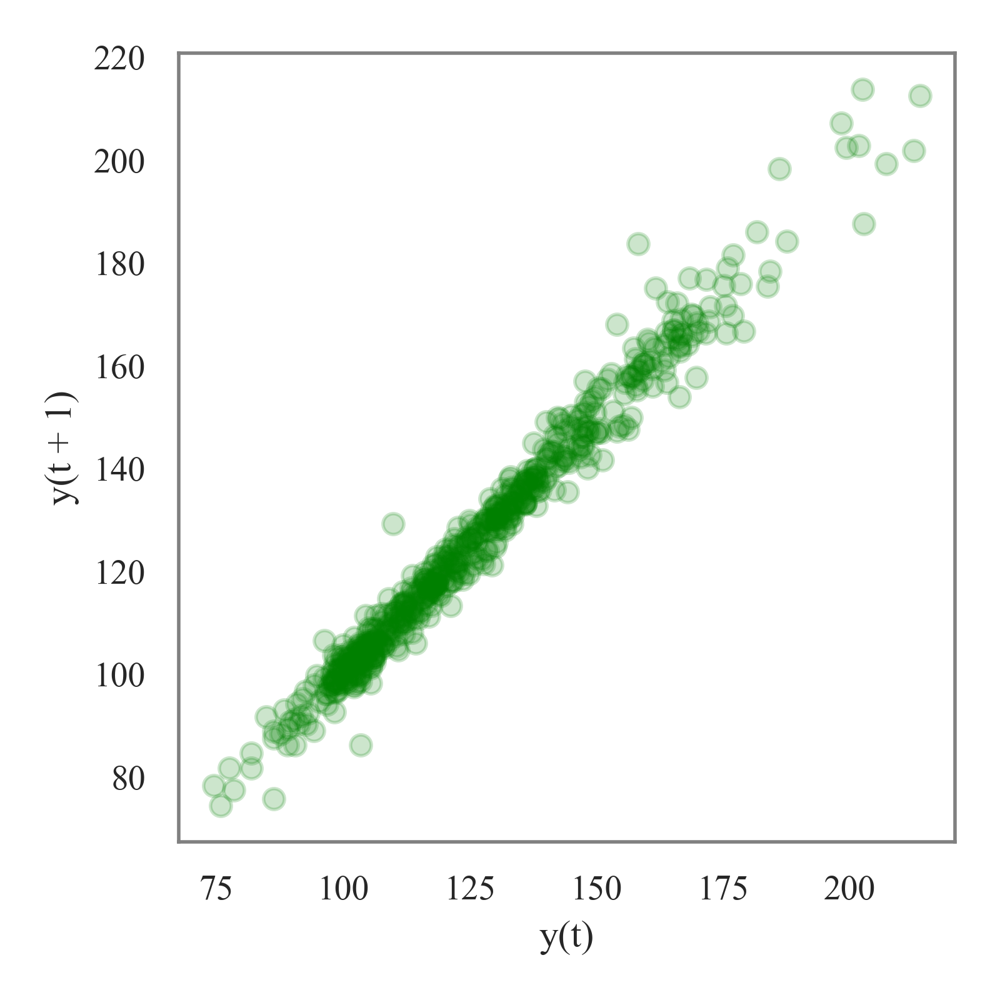

In [19]:
fig, ax = plt.subplots(figsize=(4,4))
lag_plot(processed_data, alpha=0.2, c='green')
plt.tight_layout()
plt.savefig('figs/seasonality_scatterplot.png')
pyplot.show()

### ACP & PACP: Fig5(c,d)

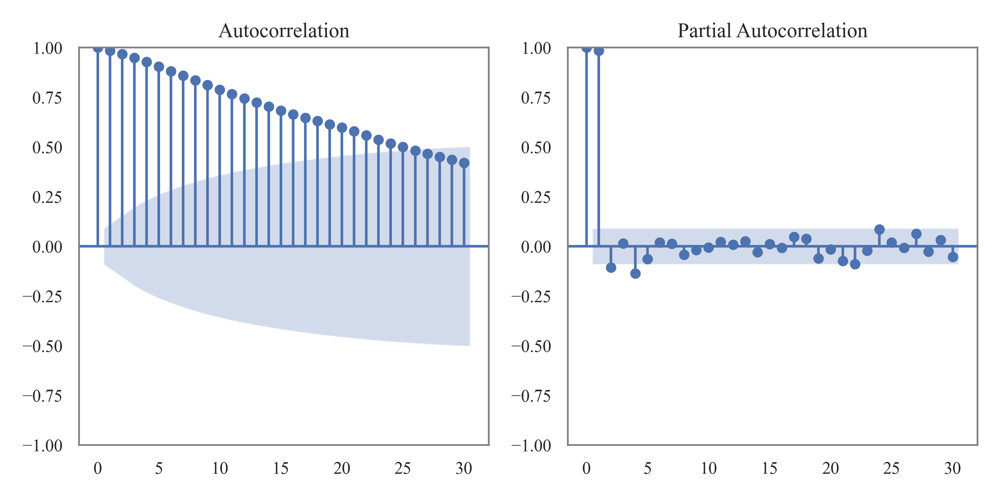

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess

# Generate synthetic time series data (ARMA process)
np.random.seed(42)
ar = np.array([1, -0.5])  # AR(1) with a coefficient of -0.5
ma = np.array([1, 0.5])   # MA(1) with a coefficient of 0.5
arma_process = ArmaProcess(ar, ma)

# Convert to a pandas series
time_series = y_train

# Plot ACF and PACF
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# ACF plot
plot_acf(time_series, lags=30, ax=axes[0])
#axes[0].set_title('Autocorrelation Function (ACF)')

# PACF plot
plot_pacf(time_series, lags=30, ax=axes[1])
#axes[1].set_title('Partial Autocorrelation Function (PACF)')

plt.tight_layout()
plt.savefig('figs/ACP_PACP.png')
plt.show()


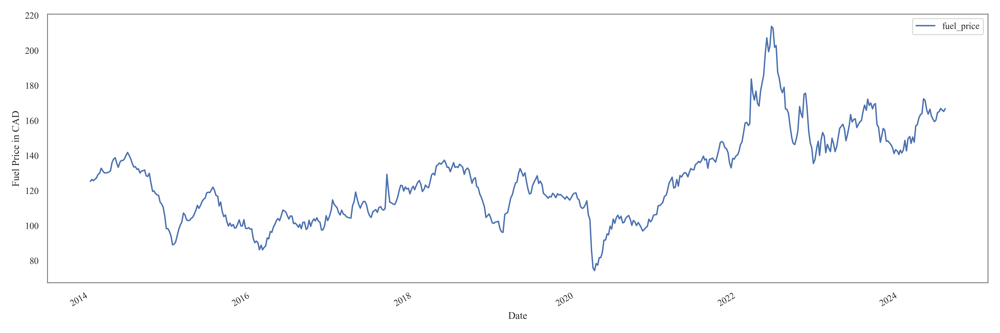

In [21]:
processed_data.plot(figsize=(15,5))
plt.ylabel('Fuel Price in CAD')

plt.tight_layout()
plt.savefig('figs/time_series.png')
plt.show()

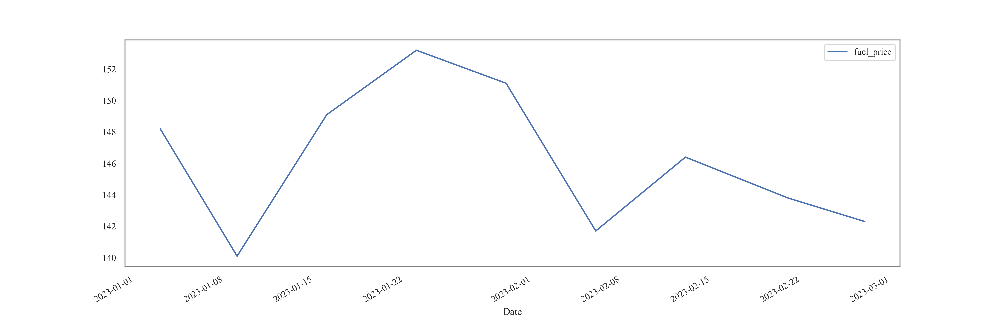

In [22]:
processed_data.loc[(processed_data.index > '01-01-2023') & (processed_data.index < '3-01-2023')] \
    .plot(figsize=(15, 5))
plt.savefig('figs/macro-analysis of price Jan-Mar2023.png')
plt.show()

### Seasonal decompostion: Fig6

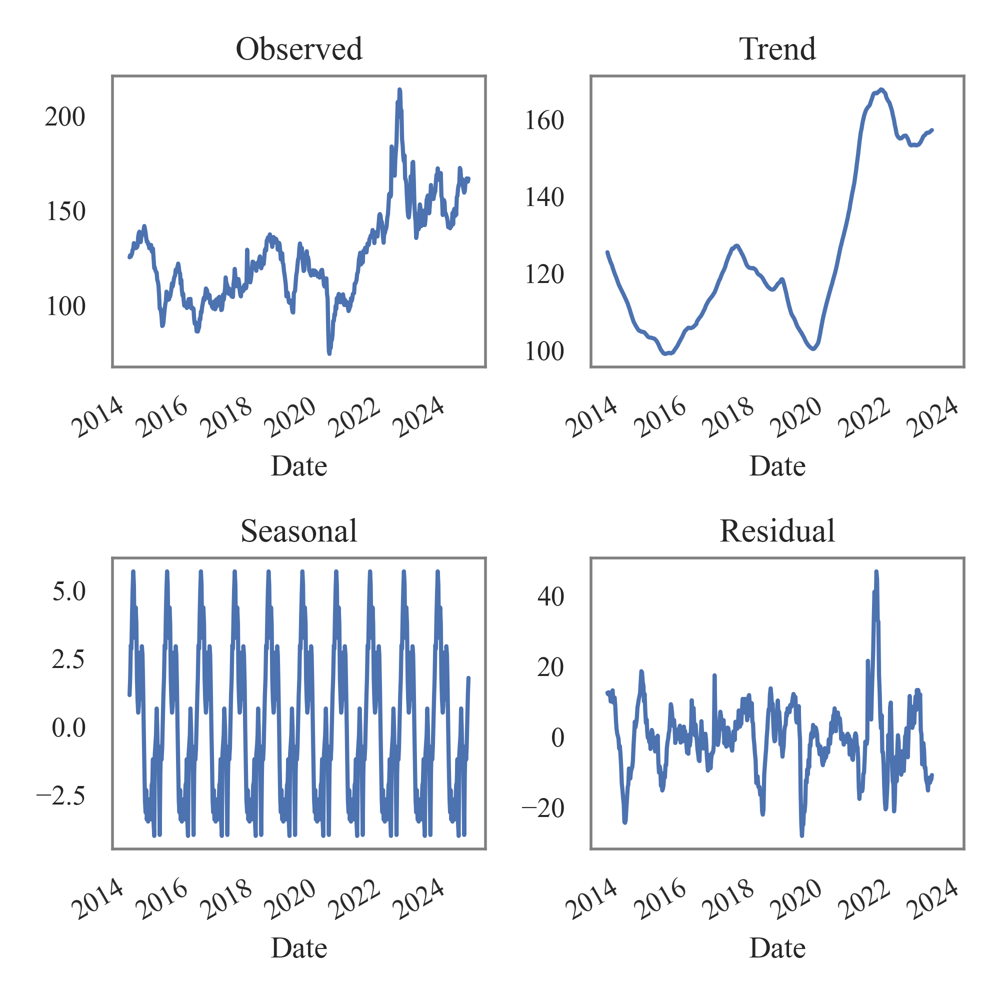

In [23]:
decomposition = seasonal_decompose(processed_data, model="additive",
                                           period=int(len(processed_data) / 10))
xticklabels = ['2014','2016','2018', '2020', '2022',  '2024']
# Create a figure with specified size
fig, axs = plt.subplots(2, 2, figsize=(5, 5))  # Adjust size as needed
# Plot each component
decomposition.observed.plot(ax=axs[0, 0])
axs[0, 0].set_title('Observed')
#axs[0, 0].set_xticklabels(xticklabels, rotation=90) 
decomposition.trend.plot(ax=axs[0, 1])
#axs[0, 1].set_xticklabels(xticklabels, rotation=90) 

axs[0,1].set_xticks(pd.date_range(start='2014', end='2025', freq='2Y'))  # Every other year
axs[0,1].set_xticklabels(pd.date_range(start='2014', end='2025', freq='2Y').year)
axs[0,1].set_title('Trend')

decomposition.seasonal.plot(ax=axs[1, 0])
#axs[1, 0].set_xticklabels(xticklabels, rotation=90) 
axs[1,0].set_title('Seasonal')
decomposition.resid.plot(ax=axs[1, 1])
axs[1,1].set_title('Residual')
#axs[1,1].set_xticklabels(xticklabels) 
# Customize x-axis ticks to show every other year
# ax = plt.gca()
axs[1,1].set_xticks(pd.date_range(start='2014', end='2025', freq='2Y'))  # Every other year
axs[1,1].set_xticklabels(pd.date_range(start='2014', end='2025', freq='2Y').year)

plt.tight_layout()
plt.savefig('figs/seasonality.png')

In [24]:
# Close all figures
plt.close('all')

# Modeling

## ARIMA

In [25]:
model_arima = ARIMA(processed_data, order=(3, 0, 0)) #.fit() X_train
model_arima_fit = model_arima.fit()

/Users/tanmoydas/Applications/anaconda3/envs/Freelancing/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/tanmoydas/Applications/anaconda3/envs/Freelancing/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/tanmoydas/Applications/anaconda3/envs/Freelancing/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [26]:
print(model_arima_fit.params)
resid = model_arima_fit.resid

const     130.235261
ar.L1       1.066879
ar.L2      -0.082016
ar.L3       0.002554
sigma2     14.622103
dtype: float64


### ARIMA model statistics: Table4

In [27]:
print(model_arima_fit.summary())

                               SARIMAX Results                                
Dep. Variable:             fuel_price   No. Observations:                  552
Model:                 ARIMA(3, 0, 0)   Log Likelihood               -1525.521
Date:                Sat, 24 Aug 2024   AIC                           3061.043
Time:                        01:22:52   BIC                           3082.610
Sample:                             0   HQIC                          3069.470
                                - 552                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        130.2353     14.016      9.292      0.000     102.765     157.705
ar.L1          1.0669      0.031     34.719      0.000       1.007       1.127
ar.L2         -0.0820      0.047     -1.739      0.0

### QQ Plot: Fig 10a

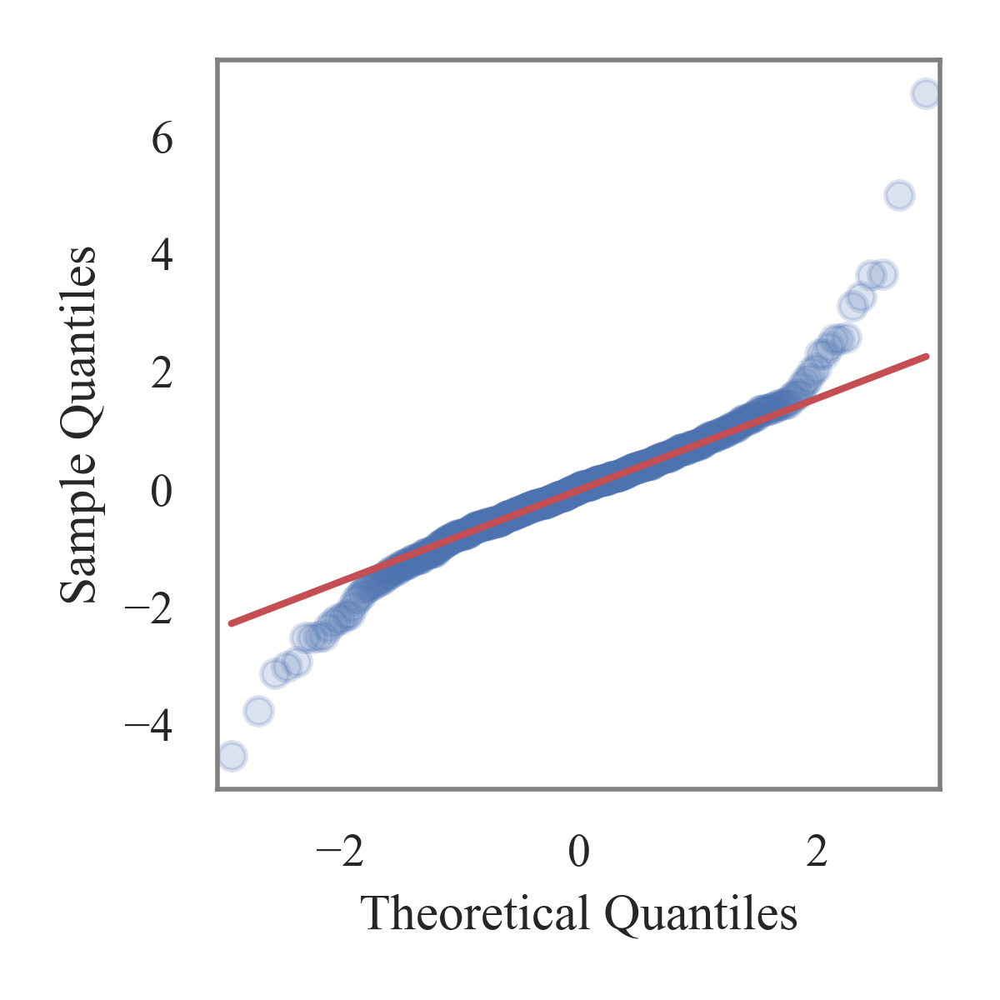

In [28]:
# Checking normality assumption
fig = plt.figure(figsize=(3, 3))
ax = fig.add_subplot(111)
fig = qqplot(resid, line="q", ax=ax, fit=True, alpha=0.2)
plt.tight_layout()
plt.savefig('figs/qqplot.png')

In [29]:
y_pred_arima = model_arima_fit.predict(start=1, end=521, exog=None, dynamic=False)
type(y_pred_arima)#.shape

pandas.core.series.Series

In [30]:
display(y_pred_arima)

y_pred_a = y_pred_arima.values[471:521] #y_test.shape

Date
2014-01-13    125.357689
2014-01-20    126.535607
2014-01-27    125.698638
2014-02-03    126.612361
2014-02-10    127.398464
                 ...    
2023-12-04    146.021191
2023-12-11    144.180016
2023-12-18    140.804391
2023-12-27    143.417582
2024-01-02    142.161841
Name: predicted_mean, Length: 521, dtype: float64

In [31]:
# Future data
X_future_raw = pd.DataFrame({'Date':pd.date_range(start='2024-01-01', periods=91)})
X_future_raw.set_index('Date', inplace=True)
X_future_raw.index = pd.to_datetime(X_future_raw.index)

X_future2 = create_features(X_future_raw)
xs = ['dayofyear', 'dayofweek', 'quarter', 'month', 'year']
X_future = X_future2[xs]
X_future.index.unique()

monday = X_future[X_future.index.weekday==0]

In [32]:
y_pred_future = model_arima_fit.forecast(13)#[0]
y_pred_future.index = monday.index
y_pred_future
#yhat2 = model_arima_fit.forecast('2024Q1')
# https://www.statsmodels.org/devel/examples/notebooks/generated/statespace_forecasting.html

/Users/tanmoydas/Applications/anaconda3/envs/Freelancing/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/tanmoydas/Applications/anaconda3/envs/Freelancing/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


Date
2024-01-01    166.469060
2024-01-08    165.982718
2024-01-15    165.495078
2024-01-22    165.013868
2024-01-29    164.539228
2024-02-05    164.071066
2024-02-12    163.609294
2024-02-19    163.153823
2024-02-26    162.704569
2024-03-04    162.261445
2024-03-11    161.824370
2024-03-18    161.393259
2024-03-25    160.968032
Name: predicted_mean, dtype: float64

In [33]:
rmse_score = metrics.root_mean_squared_error(y_pred_future, y_test)
mae_score = metrics.mean_absolute_error(y_pred_future, y_test)
print(f'RMSE Score on Test set: {rmse_score:0.2f}')
print(f'MAE Score on Test set: {mae_score:0.2f}')
# https://scikit-learn.org/stable/modules/model_evaluation.html

RMSE Score on Test set: 17.34
MAE Score on Test set: 15.93


## XGBoost

In [34]:
model_xgb = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=10,
                       early_stopping_rounds=5,
                       objective='reg:squarederror',
                       max_depth=3,
                       learning_rate=0.1)

model_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:110.61574	validation_1-rmse:130.86195
[9]	validation_0-rmse:44.73712	validation_1-rmse:42.32027


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=5,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

### Hyperparam tuning

In [35]:
learning_rate = [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3]
for l in learning_rate:
    model_xgb = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:squarederror',
                       max_depth=20,
                       learning_rate=l)
    print(l)
    model_xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

0.0001
[0]	validation_0-rmse:122.58988	validation_1-rmse:147.30218
[100]	validation_0-rmse:121.39644	validation_1-rmse:145.66452
[200]	validation_0-rmse:120.21494	validation_1-rmse:144.04288
[300]	validation_0-rmse:119.04526	validation_1-rmse:142.43710
[400]	validation_0-rmse:117.88725	validation_1-rmse:140.84703
[500]	validation_0-rmse:116.74081	validation_1-rmse:139.27252
[600]	validation_0-rmse:115.60582	validation_1-rmse:137.71341
[700]	validation_0-rmse:114.48217	validation_1-rmse:136.16955
[800]	validation_0-rmse:113.36975	validation_1-rmse:134.64081
[900]	validation_0-rmse:112.26841	validation_1-rmse:133.12703
[999]	validation_0-rmse:111.18829	validation_1-rmse:131.64296
0.001
[0]	validation_0-rmse:122.48192	validation_1-rmse:147.15405
[100]	validation_0-rmse:111.07496	validation_1-rmse:131.48720
[200]	validation_0-rmse:100.74871	validation_1-rmse:117.28829
[300]	validation_0-rmse:91.40470	validation_1-rmse:104.42046
[400]	validation_0-rmse:82.95169	validation_1-rmse:92.75968
[5

In [36]:
# Remove manual values (extract from previous code cell ++) 
error_df = pd.DataFrame([[0.0001, 0,	122.65556],
[0.0001, 100, 121.46165	],
[0.0001, 200,	120.27970],
[0.0001, 300, 119.10958],
[0.0001, 400, 117.95117],
[0.0001, 500,116.80437],
[0.0001, 600, 115.66906],
[0.0001, 700, 114.54513],
[0.0001, 800, 113.43247],
[0.0001, 900, 112.33093	],
[0.0001, 999, 111.25123	],


[0.001, 0, 	122.54756],
[0.001, 100,111.13788	],
[0.001, 200,100.81944	],
[0.001, 300,91.48905	],
[0.001, 400,83.05499	],
[0.001, 500,75.43433	],
[0.001, 600,68.54380	],
[0.001, 700,62.31813	],
[0.001, 800,56.69320	],
[0.001, 900,51.60123	],
[0.001, 999,47.04521	],


[0.01, 0, 121.46765	],
[0.01, 100, 46.41497	],
[0.01, 200, 19.50075	],
[0.01, 295, 10.85637	],

[0.1, 0, 110.67810	],
[0.1, 72, 5.97429	],

[0.2, 0, 98.71501	],
[0.2, 60, 4.64358	],

[0.3, 0, 86.78917	],
[0.3, 55, 3.78368	]])

error_df.columns = ['Learning Rate', '# Estimator', 'RMSE']

### Error curve: Fig7

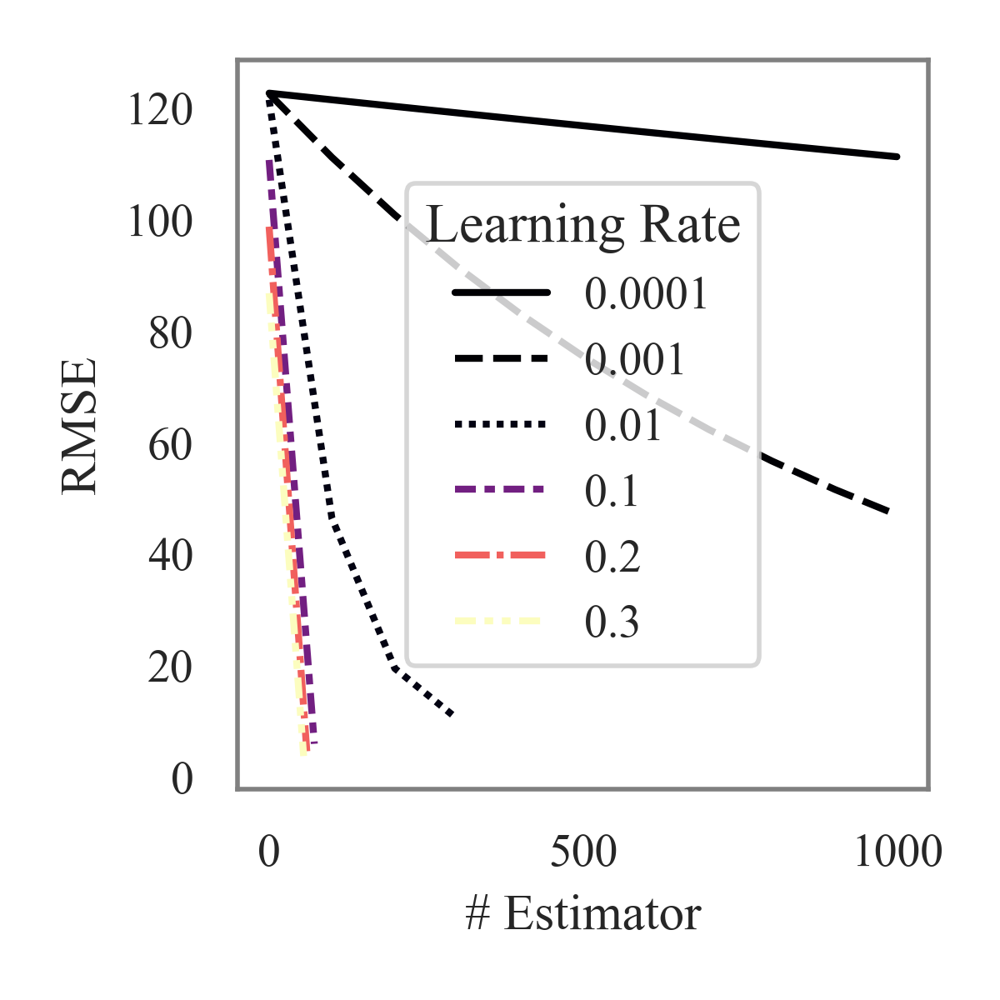

In [37]:
fig, ax = plt.subplots(figsize=(3,3))
sns.lineplot(data=error_df, x="# Estimator", y="RMSE", hue="Learning Rate", palette='magma', style="Learning Rate")
plt.tight_layout()
plt.savefig('figs/error_a.png')

In [38]:
error_df2 = pd.DataFrame([
[0.001, 0, 	122.54756, 153],
[0.001, 100,111.13788	, 138],
[0.001, 200,100.81944	, 124],
[0.001, 300,91.48905	, 111],
[0.001, 400,83.05499	,99],
[0.001, 500,75.43433	,88],
[0.001, 600,68.54380	,79],
[0.001, 700,62.31813	,70],
[0.001, 800,56.69320	,63],
[0.001, 900,51.60123	,56],
[0.001, 999,47.04521	,49]])
error_df2.columns = ['Learning Rate', '# Estimator', 'Training Error', 'Test Error']

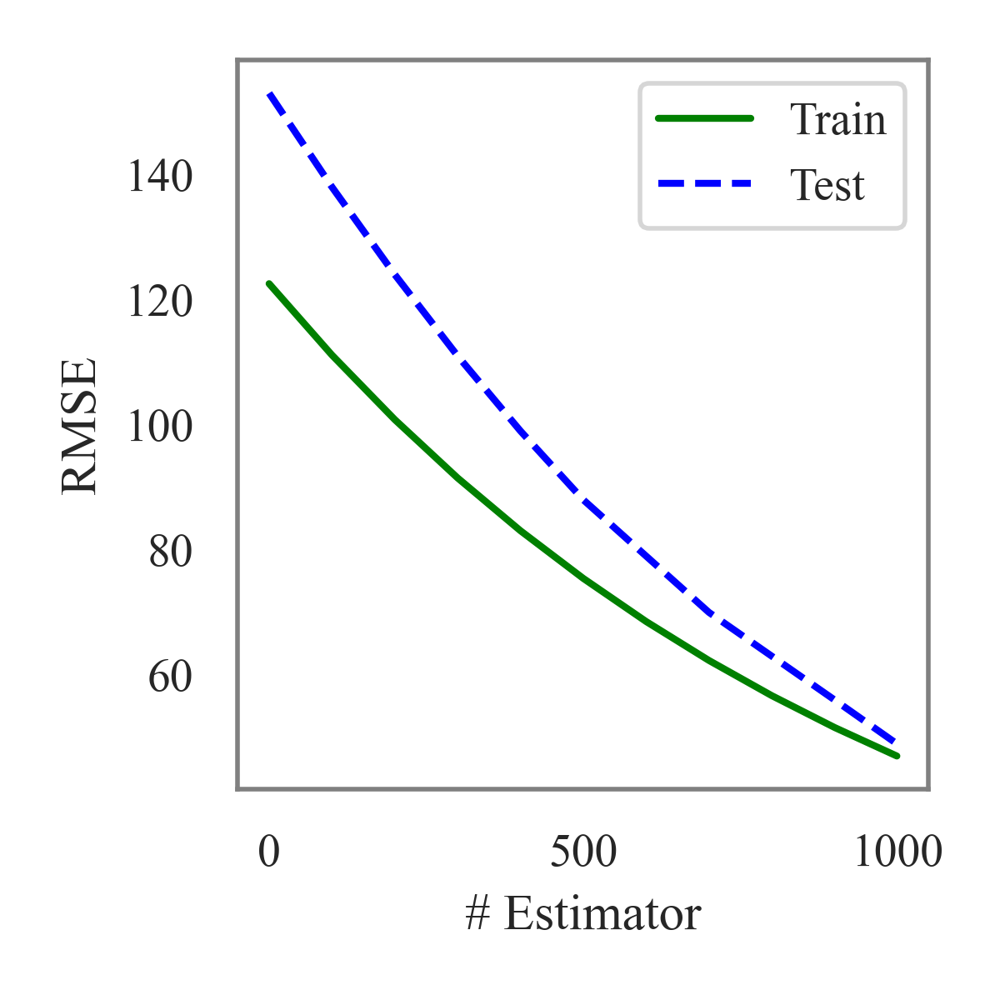

In [39]:
fig, ax = plt.subplots(figsize=(3,3))
sns.lineplot(data=error_df2, x="# Estimator", y='Training Error', label='Train', c='green')
sns.lineplot(data=error_df2, x="# Estimator", y='Test Error', label='Test', c='blue', linestyle='--')

#plt.legend(loc='upper right', labels=['Test error'])
#ax.legend()
plt.ylabel('RMSE')

plt.tight_layout()
plt.savefig('figs/error_b.png')
plt.show()

In [40]:
y_pred = model_xgb.predict(X_validation)
rmse_score = np.sqrt(metrics.root_mean_squared_error(validation['fuel_price'], y_pred))
mae_score = np.sqrt(metrics.mean_absolute_error(validation['fuel_price'], y_pred))
print(f'RMSE Score on Test set: {rmse_score:0.2f}')
print(f'MAE Score on Test set: {mae_score:0.2f}')
# https://scikit-learn.org/stable/modules/model_evaluation.html

RMSE Score on Test set: 3.83
MAE Score on Test set: 3.48


### Important variables: Fig 10b

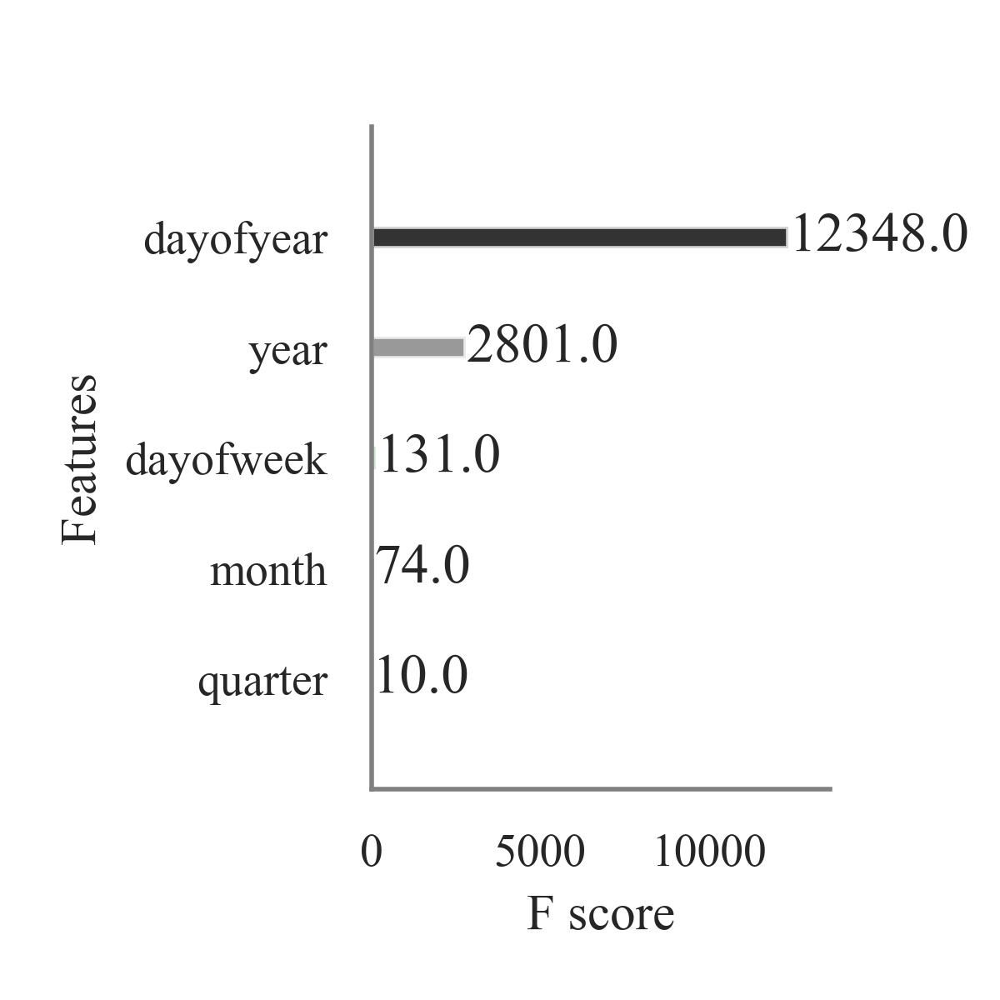

In [42]:
plt.rcParams["figure.figsize"] = (3, 3)
plot_importance(model_xgb, color=['red', 'blue', 'green','gray', 'black'], alpha=0.8) #, height=0.7
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.title('')
plt.savefig('figs/feature_importance.png')
plt.show()
# https://xgboost.readthedocs.io/en/stable/python/python_api.html

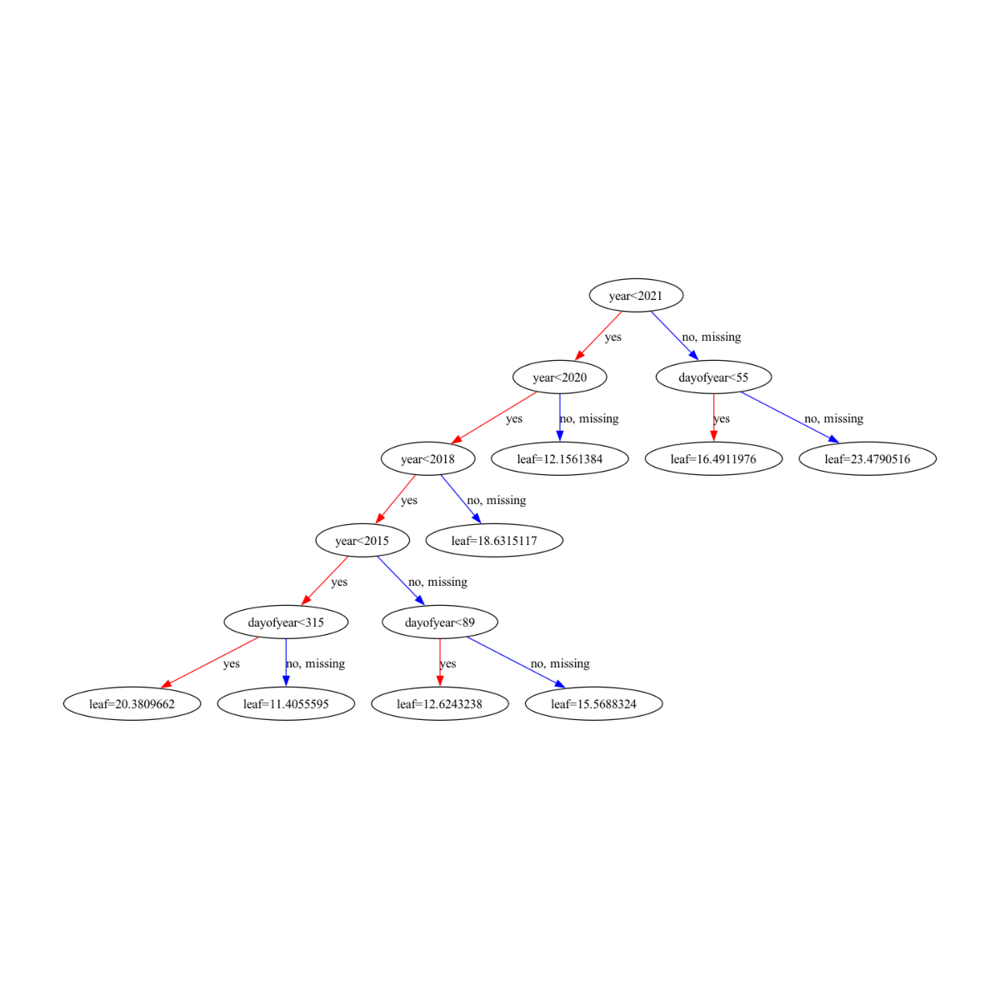

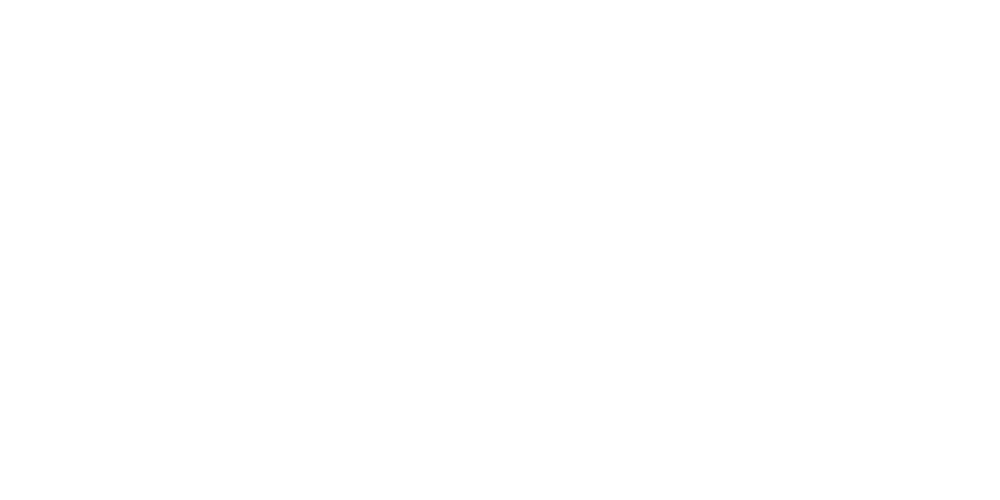

In [43]:
from xgboost import plot_tree
from matplotlib import font_manager

plt.figure(figsize=(16, 8)) 
plot_tree(model_xgb, num_trees=2, fontsize=20)
# Set the font size for all text elements
font = font_manager.FontProperties(size=15)  # Adjust the font size as needed
for text in ax.get_figure().findobj(match=plt.Text):
    text.set_fontproperties(font)
    
plt.tight_layout()
plt.savefig('figs/XGBoost_model_tree.png')
plt.show()
# motivated from https://machinelearningmastery.com/visualize-gradient-boosting-decision-trees-xgboost-python/

## ACO

In [44]:
from src.ACO import AntColonyOptimizer


[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149.7 150.9 147.  150.6 147.7 157.
 157.7]
[140.6 143.1 141.5 143.2 148.7 142.7 149

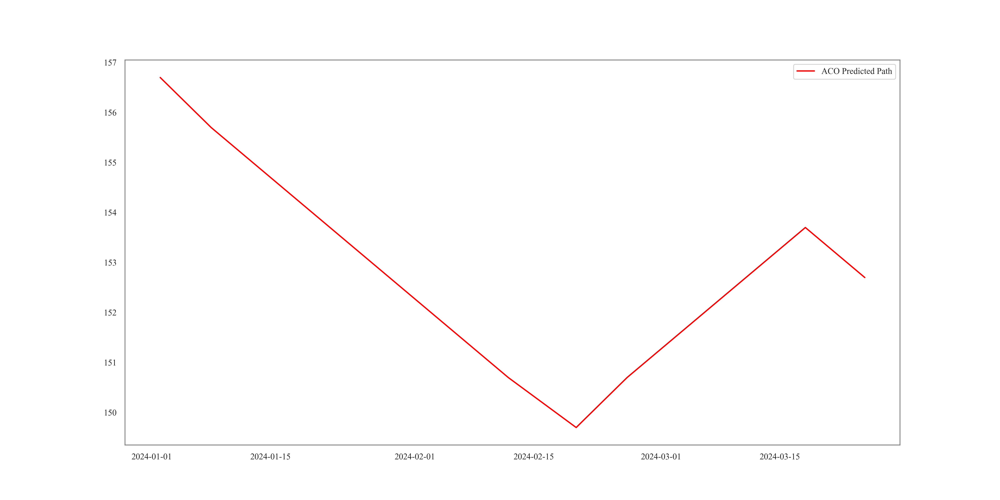

DatetimeIndex(['2024-01-02', '2024-01-08', '2024-01-15', '2024-01-22',
               '2024-01-29', '2024-02-05', '2024-02-12', '2024-02-20',
               '2024-02-26', '2024-03-04', '2024-03-11', '2024-03-18',
               '2024-03-25'],
              dtype='datetime64[ns]', name='Date', freq=None)


In [45]:
# Example: Time series data
np.random.seed(42)
time_series = y_test
# Initialize ACO
aco = AntColonyOptimizer(n_ants=20, n_iterations=50, decay=0.95, alpha=1, beta=2)

# Fit the model on the time series data
aco.fit(time_series, predict_steps=13)

# Predict the next 10 time steps
predicted_path = aco.predict()

# Output the predicted path and associated error
print("Predicted Path:", predicted_path)
print("Best Path Error:", aco.best_error)



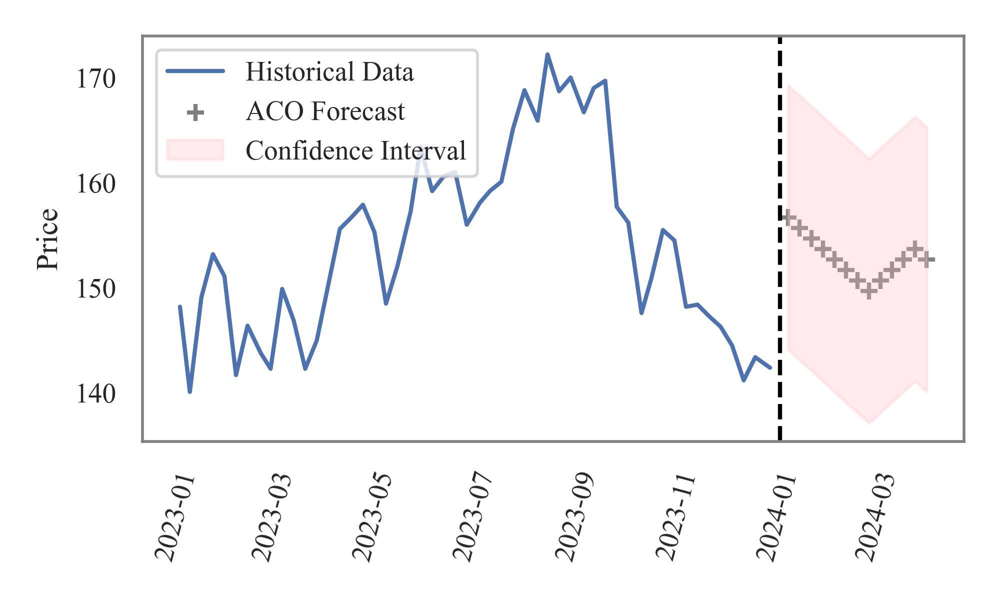

In [46]:
from scipy.stats import norm
import matplotlib.dates as mdates
y_forecasting = [156.7, 155.7, 154.7, 153.7, 152.7, 151.7, 150.7, 149.7, 150.7, 151.7, 152.7, 153.7, 152.7]

residuals = y_test - aco.predict()
sigma = np.std(residuals)
conf_int = pd.DataFrame({
    'lower Value': y_forecasting - norm.ppf(0.975) * sigma,
    'upper Value': y_forecasting + norm.ppf(0.975) * sigma
})


plt.figure(figsize=(5, 3)) 
plt.plot(X_validation.index, y_validation, label='Historical Data')
plt.axvline(pd.to_datetime('01-02-2024'), color='black', ls='--')

plt.scatter(pd.date_range(X_test.index[0], periods=len(y_forecasting) , freq='W'),
                     y_forecasting, label='ACO Forecast', color='black', marker='+', alpha=0.5)
plt.fill_between(pd.date_range(X_test.index[0], periods=len(y_forecasting) , freq='W'),
                             conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.3,
                             label='Confidence Interval')
plt.xticks(rotation=75)
plt.ylabel('Price')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.legend(loc='upper left')
plt.tight_layout()
plt.savefig(f'figs/ACO_forecasting.png', dpi=400)
plt.show()

In [47]:
X_test.index[0]

Timestamp('2024-01-02 00:00:00')

## ACO-XGBoost
Ant Colony Optimization for Hyperparam tuing

### ACO-XGBoost 1

In [58]:
# +++ change to code
# Assuming X_train, X_test, y_train, y_test are defined and loaded
from src.ACO_XGBoost_1 import AntColonyOptimizer
from sklearn.metrics import root_mean_squared_error

num_ants = 20
num_iterations = 20
evaporation_rate = 0.8
pheromone_deposition_rate = 0.2

hyperparameter_ranges = {
    'n_estimators': (20, 2000),
    'max_depth': (20, 40),
    'learning_rate': (0.0001, 0.003)
}

aco = AntColonyOptimizer(num_ants, num_iterations, evaporation_rate, pheromone_deposition_rate, hyperparameter_ranges)

# Optimize hyperparameters
best_params, best_score = aco.optimize(X_train, y_train, X_validation, y_validation)

print('best_params:', best_params)
print('best_score:', best_score)

#+++ other hyperparams of XGBoost?? 
"""
eval metric, n_jobs,  
"""

ants [{'n_estimators': 1791.5789473684213, 'max_depth': 31.57894736842105, 'learning_rate': 0.0002526315789473684}]
ants [{'n_estimators': 1791.5789473684213, 'max_depth': 31.57894736842105, 'learning_rate': 0.0002526315789473684}, {'n_estimators': 957.8947368421053, 'max_depth': 23.157894736842106, 'learning_rate': 0.0020842105263157895}]
ants [{'n_estimators': 1791.5789473684213, 'max_depth': 31.57894736842105, 'learning_rate': 0.0002526315789473684}, {'n_estimators': 957.8947368421053, 'max_depth': 23.157894736842106, 'learning_rate': 0.0020842105263157895}, {'n_estimators': 1583.157894736842, 'max_depth': 34.73684210526316, 'learning_rate': 0.001168421052631579}]
ants [{'n_estimators': 1791.5789473684213, 'max_depth': 31.57894736842105, 'learning_rate': 0.0002526315789473684}, {'n_estimators': 957.8947368421053, 'max_depth': 23.157894736842106, 'learning_rate': 0.0020842105263157895}, {'n_estimators': 1583.157894736842, 'max_depth': 34.73684210526316, 'learning_rate': 0.00116842105

'\neval metric, n_jobs,  \n'

In [ ]:
# Train final model with best parameters
from xgboost import XGBRegressor
ACO_XGBoost = XGBRegressor(
    n_estimators=int(best_params['n_estimators']),
    max_depth=int(best_params['max_depth']),
    learning_rate=best_params['learning_rate']
)
ACO_XGBoost.fit(X_train, y_train)

# Predict and evaluate
predictions = ACO_XGBoost.predict(X_test)
rmse = root_mean_squared_error(y_test, predictions)
print('Root Mean Squared Error:', rmse)

### ACO-XGBoost 2

In [ ]:
## Summary statistics
import pandas as pd
evaporation_rate = 0.2
lags = 4

# Summary data
summary_data = {
    'Metric': [
        'Dataset Size',
        'Training Set Size',
        'Test Set Size',
        'Number of Features',
        'Lag Features',
        'Number of Ants',
        'Number of Iterations',
        'Evaporation Rate',
        'Best n_estimators',
        'Best max_depth',
        'Best learning_rate',
        'Root Mean Squared Error'
    ],
    'Value': [
        len(data),
        len(X_train),
        len(X_test),
        X_train.shape[1],
        lags,
        num_ants,
        num_iterations,
        evaporation_rate,
        best_params['n_estimators'],
        best_params['max_depth'],
        best_params['learning_rate'],
        rmse
    ]
}

# Create DataFrame
summary_df = pd.DataFrame(summary_data)

# Display the summary table
print(summary_df)


### Best Cost vs iteration: Fig8

Generation 1: Best Cost = 624.0733401684028
Generation 2: Best Cost = 609.3162353416282
Generation 3: Best Cost = 582.1127771347809
Generation 4: Best Cost = 582.1127771347809
Generation 5: Best Cost = 582.1127771347809
Generation 6: Best Cost = 582.1127771347809
Generation 7: Best Cost = 582.1127771347809
Generation 8: Best Cost = 582.1127771347809
Generation 9: Best Cost = 582.1127771347809
Generation 10: Best Cost = 582.1127771347809


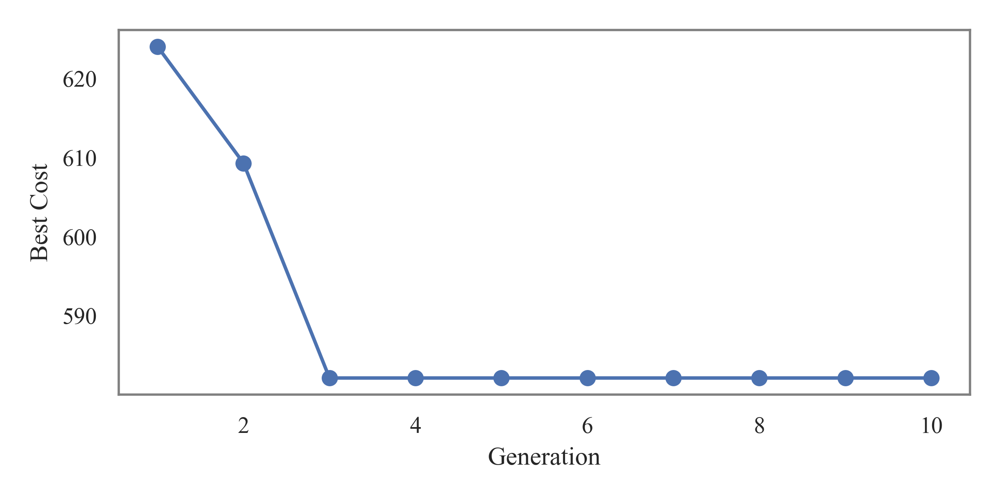

In [48]:
# Example usage
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from src.best_cost_vs_iteration import Ant, ACOOptimizer
param_space = {
    'n_estimators': [50, 100, 500],
    'max_depth': [3, 5, 20],
    'learning_rate': [0.0001, 0.1, 0.2],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}


optimizer = ACOOptimizer(param_space, num_ants=5, num_generations=10)
optimizer.optimize(X_train, y_train)
optimizer.plot_cost_vs_generation()
# replace data with our data +++ 

### ACO-XGBoost model prediction: Fig9

RMSE of ACO-XGBoost:  4.1068699365729255


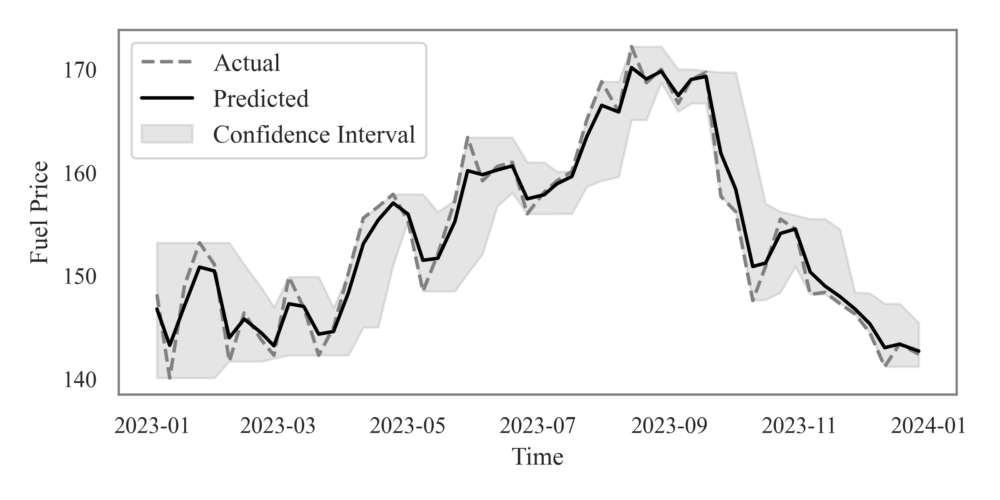

In [49]:
from src.time_series_plotter import TimeSeriesPlotter
from sklearn.utils import resample
from xgboost import XGBRegressor

time = validation_raw.index.to_pydatetime() #[np.arange(0, 100), np.arange(0, 100)]
actual = y_validation #[np.sin(0.1 * np.arange(0, 100)), np.cos(0.1 * np.arange(0, 100))]
model_name = 'ACO-XGBoost' #'ACO-XGBoost'
# Train final model with best parameters
ACO_XGBoost = XGBRegressor(
    n_estimators=500,
    max_depth=37,
    learning_rate=0.002
)
""" These 3 hyperparameters are determined by ACO"""
ACO_XGBoost.fit(X_validation, y_validation)

y_pred_validation = ACO_XGBoost.predict(X_validation)

# RMSE value ++ 
print('RMSE of ACO-XGBoost: ', metrics.root_mean_squared_error(y_pred_validation, y_validation))

# Step 2: Bootstrap resampling and making predictions
n_bootstraps = 100  # Number of bootstrap samples
predictions = np.zeros((n_bootstraps, len(X_validation)))

for i in range(n_bootstraps):
    # Resample the data
    X_resampled, y_resampled = resample(X_validation, y_validation)
    
    # Fit the model on resampled data
    xgboost_model_resampled = xgb.XGBRegressor() #n_estimators=500, max_depth=37, learning_rate=0.002)  # replace with ACO-XGBoost +++
    xgboost_model_resampled.fit(X_resampled, y_resampled)
    
    # Predict on the test data
    predictions[i, :] = xgboost_model_resampled.predict(X_validation)

# Step 3: Calculate the prediction intervals
lower_bound = np.percentile(predictions, 2.5, axis=0)
upper_bound = np.percentile(predictions, 97.5, axis=0)
mean_prediction = np.mean(predictions, axis=0)

# formatting
time= [time.tolist()]
actual= [actual.tolist()]
mean_prediction= [mean_prediction.tolist()]
lower_bound= [lower_bound.tolist()]
upper_bound= [upper_bound.tolist()]
y_pred_validation = [y_pred_validation.tolist()]
plotter = TimeSeriesPlotter(time, actual, mean_prediction, lower_bound, upper_bound, model_name)
plotter.plot(model_name)

[0]	validation_0-rmse:22.83607	validation_1-rmse:27.21632
[100]	validation_0-rmse:19.08462	validation_1-rmse:20.09119
[200]	validation_0-rmse:15.99361	validation_1-rmse:14.62514
[300]	validation_0-rmse:13.43870	validation_1-rmse:10.63284
[400]	validation_0-rmse:11.31553	validation_1-rmse:7.66011
[499]	validation_0-rmse:9.56062	validation_1-rmse:5.75027
RMSE of XGBoost:  12.243808915902449


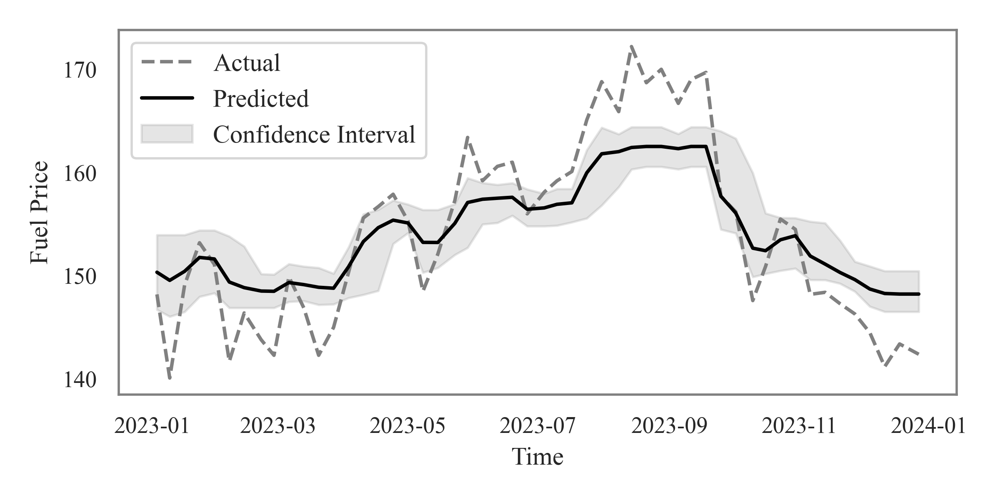

In [50]:
model_xgb_default = XGBRegressor(    n_estimators=500,
    max_depth=37,
    learning_rate=0.002)

model_xgb_default.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)
y_pred_validation_2 = model_xgb_default.predict(X_validation)
print('RMSE of XGBoost: ', metrics.root_mean_squared_error(y_pred_validation_2, y_validation))

n_bootstraps = 100  # Number of bootstrap samples
predictions = np.zeros((n_bootstraps, len(X_validation)))

for i in range(n_bootstraps):
    # Resample the data
    X_resampled, y_resampled = resample(X_validation, y_validation)
    
    # Fit the model on resampled data
    xgboost_model_resampled = xgb.XGBRegressor(n_estimators=500,
    max_depth=37,
    learning_rate=0.002) #n_estimators=500, max_depth=37, learning_rate=0.002)  # replace with ACO-XGBoost +++
    xgboost_model_resampled.fit(X_resampled, y_resampled)
    
    # Predict on the test data
    predictions[i, :] = xgboost_model_resampled.predict(X_validation)

# Step 3: Calculate the prediction intervals
lower_bound = np.percentile(predictions, 2.5, axis=0)
upper_bound = np.percentile(predictions, 97.5, axis=0)
mean_prediction = np.mean(predictions, axis=0)

# formatting
mean_prediction= [mean_prediction.tolist()]
lower_bound= [lower_bound.tolist()]
upper_bound= [upper_bound.tolist()]
y_pred_validation2 = [y_pred_validation_2.tolist()]
model_name = 'XGBoost'
plotter = TimeSeriesPlotter(time, actual, mean_prediction, lower_bound, upper_bound, model_name)
plotter.plot(model_name)

In [51]:
model_xgb_default = XGBRegressor(    n_estimators=500,
    max_depth=37,
    learning_rate=0.002)

model_xgb_default.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)
y_pred_validation_xgb = model_xgb_default.predict(X_validation)


print('RMSE of XGBoost: ', metrics.root_mean_squared_error(y_pred_validation_xgb, y_validation))


[0]	validation_0-rmse:22.83607	validation_1-rmse:27.21632
[100]	validation_0-rmse:19.08462	validation_1-rmse:20.09119
[200]	validation_0-rmse:15.99361	validation_1-rmse:14.62514
[300]	validation_0-rmse:13.43870	validation_1-rmse:10.63284
[400]	validation_0-rmse:11.31553	validation_1-rmse:7.66011
[499]	validation_0-rmse:9.56062	validation_1-rmse:5.75027
RMSE of XGBoost:  12.243808915902449


In [52]:
time = validation_raw.index.to_pydatetime() #[np.arange(0, 100), np.arange(0, 100)]
actual = y_validation #[np.sin(0.1 * np.arange(0, 100)), np.cos(0.1 * np.arange(0, 100))]
model_name = 'XGBoost'

# Step 2: Bootstrap resampling and making predictions
n_bootstraps = 100  # Number of bootstrap samples
predictions = np.zeros((n_bootstraps, len(X_validation)))

for i in range(n_bootstraps):
    # Resample the data
    X_resampled, y_resampled = resample(X_validation, y_validation)
    
    # Fit the model on resampled data
    xgboost_model_resampled = xgb.XGBRegressor()  
    xgboost_model_resampled.fit(X_resampled, y_resampled)
    
    # Predict on the test data
    predictions[i, :] = xgboost_model_resampled.predict(X_validation)

# Step 3: Calculate the prediction intervals
lower_bound = np.percentile(predictions, 2.5, axis=0)
upper_bound = np.percentile(predictions, 97.5, axis=0)
mean_prediction = np.mean(predictions, axis=0)

# formatting
time= [time.tolist()]
actual= [actual.tolist()]
mean_prediction= [mean_prediction.tolist()]
lower_bound= [lower_bound.tolist()]
upper_bound= [upper_bound.tolist()]
y_pred_validation_xgb = [y_pred_validation_xgb.tolist()]

#plotter = TimeSeriesPlotter(time, actual, y_pred_validation_xgb, lower_bound, upper_bound, model_name)
# plotter = TimeSeriesPlotter(time, actual, predicted, lower_ci, upper_ci)
#plotter.plot()

In [53]:
import plotly.graph_objects as go
y_future = model_xgb.predict(X_future)


data_future = pd.DataFrame()
data_future.index = X_future.index
data_future['y_future'] = y_future

data_future2 = data_future.reset_index()


fig = px.line(data_future2, x='Date', y='y_future', render_mode='webg1')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="3m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(step="all")
        ])
    )
)
fig.show()
plt.savefig('figs/interactive.png')
# need to fix x axis value+++ 

# Model validation and model selection

## Performance of different models: Table7

In [54]:
# ++

## Forecasting and CI on Test data: Fig11 

In [55]:
test_raw

,fuel_price
Date,
2024-01-02,140.6
2024-01-08,143.1
2024-01-15,141.5
2024-01-22,143.2
2024-01-29,148.7
2024-02-05,142.7
2024-02-12,149.7
2024-02-20,150.9
2024-02-26,147.0


/Users/tanmoydas/Documents/GitHub/Data-Science/Ant Colony Optimization augmented XGBoost in Python/src/forecasting_plot.py:113: UserWarning:

FixedFormatter should only be used together with FixedLocator



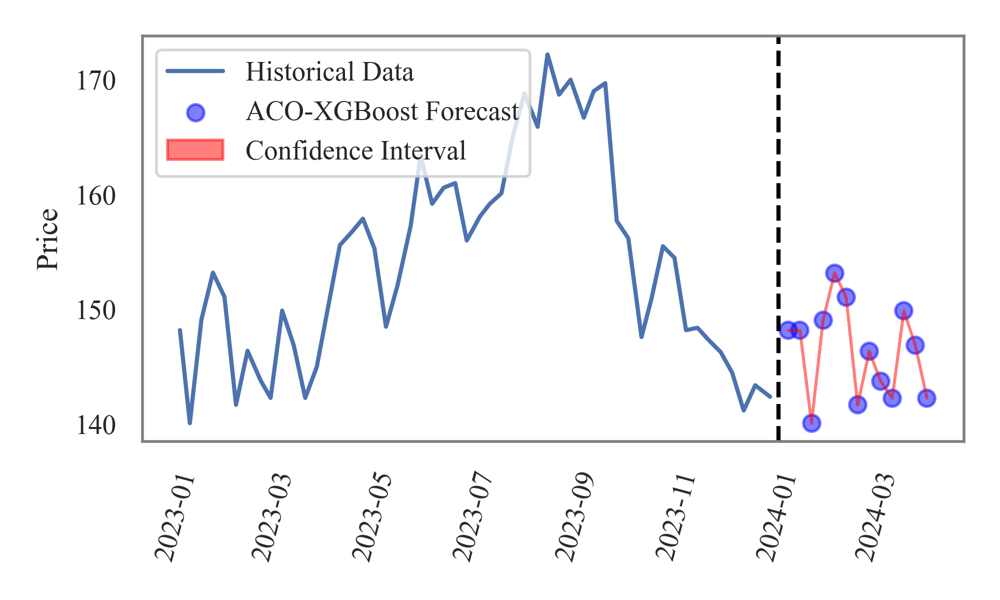

In [56]:
# Example usage:
# Assuming you have a DataFrame `df` with a DateTime index and a 'Value' column
from src.forecasting_plot import ForecastingPLot
forecast_horizon = 13

model_type = 'ACO-XGBoost' # 'ARIMA', 'XGBoost' ACO-XGBoost
#validation = pd.read_csv('your_data.csv', index_col='date', parse_dates=True)
# Initialize the forecaster
forecaster = ForecastingPLot(X_validation, X_test, y_validation, y_test, 
                             target_column='fuel_price', model_type=model_type, forecast_horizon=forecast_horizon)
#forecaster.plot_forecast(model_type=model_type)
forecaster.train_test_split(test_size=0.1)
if model_type=='ARIMA':
    forecaster.fit_model(order=(2, 0, 1))  # For ARIMA
else:
    forecaster.fit_model()

if model_type=='ACO': forecaster.forecast(steps=13)
else: forecaster.forecast(steps=91)

forecaster.plot_forecast(model_type=model_type, d=X_validation.index)

## Distribution: Fig12

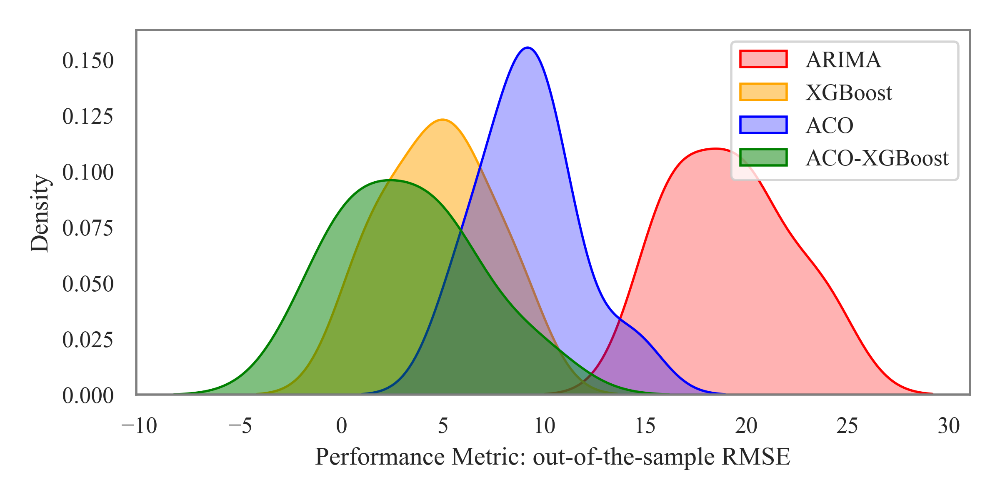

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Simulate model performance data (e.g., accuracy scores)
np.random.seed(42)
model1 = np.random.normal(17.38, 4, 10)
model2 = np.random.normal(7.5, 3.5, 10)
model3 = np.random.normal(9.9, 3, 10)
model4 = np.random.normal(4.1, 3, 10)

# Create a plot for the distributions
plt.figure(figsize=(6, 3))

# Plot KDE for each model
sns.kdeplot(model1, fill=True, label='ARIMA', color='red', alpha=0.3)
sns.kdeplot(model2, fill=True, label='XGBoost', color='orange', alpha=0.5)
sns.kdeplot(model3, fill=True, label='ACO', color='blue', alpha=0.3)
sns.kdeplot(model4, fill=True, label='ACO-XGBoost', color='green', alpha=0.5)

# Customize the plot
#plt.title('Distribution of Model Performance')
plt.xlabel('Performance Metric: out-of-the-sample RMSE')
plt.ylabel('Density')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.savefig('figs/distribution of RMSE.png')
plt.show()
